# Predicting Medical Insurance Costs Using Personal Health & Telehealth Data

**Team**  
- Neelam Gujar 
- Samiksha Singh 
- Purtee Bhise 

### Overview
We aim to predict individual medical insurance costs using health-related attributes and telehealth system data.
We use public health indicators and engagement with telehealth infrastructure as predictive features.
Our approach combines individual-level data with aggregated system metrics to better capture cost-driving behaviors.
This can improve pricing models for insurers and cost awareness for individuals.

### Data Overview
Source: [CMS](https://data.cms.gov/resources/medicare-telehealth-trends-data-dictionary)  

The Medicare telehealth and beneficiary health dataset provides a comprehensive picture of beneficiary characteristics, health conditions, healthcare utilization, and insurance metrics. The dataset integrates standard Medicare enrollment data with detailed health status information and telehealth usage statistics.

1. Key Variable Categories
The dataset includes the following major variable categories:

>>Demographic Information

Age: Beneficiary age in years
Height and Weight: Physical measurements in cm and kg respectively
Geographic Variables: Beneficiary geographic location and rural/urban status (in the original Medicare data)
Race/Ethnicity and Sex: Standard demographic identifiers (in the original Medicare data)

>>Health Status Indicators

Chronic Disease Status: Binary indicator (0/1) for presence of chronic conditions
Diabetes Status: Binary indicator (0/1) for diabetes
Blood Pressure Status: Binary indicator (0/1) for hypertension
Transplant History: Binary indicator (0/1) for past organ transplantation
Allergies: Binary indicator (0/1) for presence of known allergies
Family Cancer History: Binary indicator (0/1) for cancer in family medical history
Surgical History: Count of major surgeries the beneficiary has undergone

>>Insurance and Financial Information

Premium Price: Medicare premium cost in dollars
Part B Enrollment: Total Medicare Part B enrollment figures

>>Telehealth Utilization Metrics

Telehealth Eligible Total: Number of beneficiaries eligible for telehealth services
Telehealth Usage Total: Number of beneficiaries who actually used telehealth services
Telehealth Usage Percentage: Proportion of eligible beneficiaries utilizing telehealth (values between 0-1)

In [12]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Load dataset
file_path = "Insurance_DatasetFinal.csv"
df = pd.read_csv(file_path)

# Data preview
print("\nData Snapshot:")
display(df.head())

# Data summary
print("\nData Description:")
print(df.describe())

# Check NA values
print("\nMissing Values:")
print(df.isna().sum())


Data Snapshot:


,age,has_diabetes,has_blood_pressure,had_transplant,has_chronic_disease,height_cm,weight_kg,has_known_allergies,family_cancer_history,major_surgeries_count,premium_price,telehealth_eligible_total,PartB_Enrollment_Total,Telehealth_Usage_Total,Telehealth_Usage_Pct
0,45,0.0,0,0,0,155.0,57.0,0,0,0,25000.0,26643001,2.776232e+07,12371786,0.4644
1,60,1.0,0,0,0,180.0,73.0,0,0,0,29000.0,78497,1.014557e+05,13194,0.1816
2,36,1.0,1,0,0,158.0,59.0,0,0,1,23000.0,26643001,2.776232e+07,12371786,0.4644
3,52,1.0,1,0,1,183.0,93.0,0,0,2,28000.0,3869764,4.092286e+06,2192809,0.5667
4,38,0.0,0,0,1,166.0,88.0,0,0,1,23000.0,78497,1.014557e+05,13194,0.1816



Data Description:
                age  has_diabetes  has_blood_pressure  had_transplant  \
count  15000.000000  14700.000000        15000.000000    15000.000000   
mean      41.648733      0.419048            0.464800        0.053267   
std       14.068376      0.493420            0.498776        0.224572   
min       18.000000      0.000000            0.000000        0.000000   
25%       30.000000      0.000000            0.000000        0.000000   
50%       42.000000      0.000000            0.000000        0.000000   
75%       53.000000      1.000000            1.000000        0.000000   
max       69.000000      1.000000            1.000000        1.000000   

       has_chronic_disease     height_cm     weight_kg  has_known_allergies  \
count         15000.000000  14550.000000  14625.000000         15000.000000   
mean              0.180867    168.143711     77.012581             0.216067   
std               0.384921     10.502072     15.461575             0.411574   
min    

### Preprocessing

In this stage, we prepared the data for modeling:
- Removed any duplicate records to ensure unique entries.
- Handled missing values introduced during simulation using median imputation, which is robust to outliers.
- Enforced consistent data types (e.g., all binary features as integers) to maintain compatibility with ML algorithms.
These steps ensure that the model receives clean, well-structured data for training.

In [13]:
# Drop duplicates if any
df.drop_duplicates(inplace=True)

# Handle missing values (realistic strategy: fill numerical with median)
df.fillna(df.median(numeric_only=True), inplace=True)

# Ensure correct data types
df = df.astype({
    'age': 'int',
    'has_diabetes': 'int',
    'has_blood_pressure': 'int',
    'had_transplant': 'int',
    'has_chronic_disease': 'int',
    'height_cm': 'int',
    'weight_kg': 'int',
    'has_known_allergies': 'int',
    'family_cancer_history': 'int',
    'major_surgeries_count': 'int',
    'premium_price': 'int'
})

### Exploratory Data Analysis (EDA)

In this section, we analyze the distribution and relationships between our variables.
- The histogram helps us understand the skewness and spread of `premium_price`.
- The heatmap reveals correlations, helping us identify highly related features (e.g. weight vs. premium).
- The histogram visualization to reveal the multimodal distribution of premium prices
- The pairplot visualizations to examine the interactions between multiple demographic and health variables simultaneously.

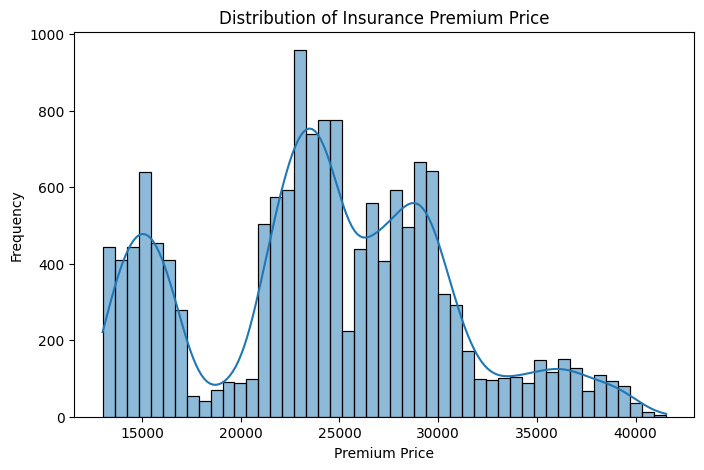

In [6]:
# Distribution of target variable
plt.figure(figsize=(8, 5))
sns.histplot(df['premium_price'], kde=True)
plt.title('Distribution of Insurance Premium Price')
plt.xlabel('Premium Price')
plt.ylabel('Frequency')
plt.show()

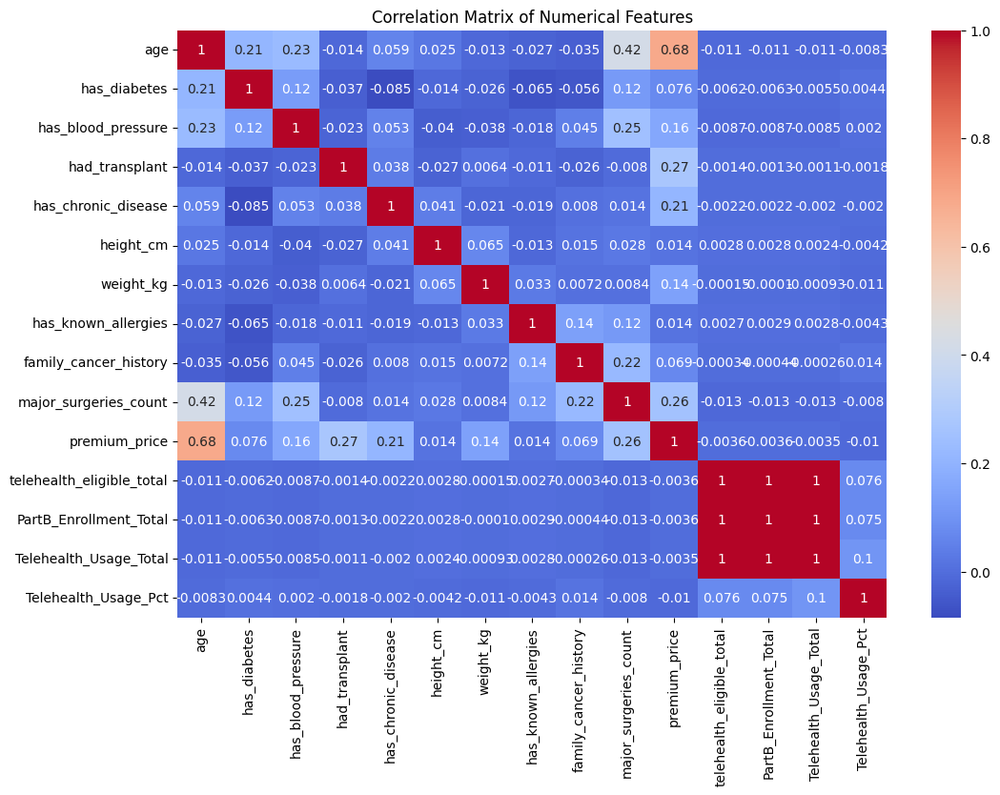

In [7]:
# Correlation heatmap
plt.figure(figsize=(12, 8))
sns.heatmap(df.corr(numeric_only=True), annot=True, cmap="coolwarm")
plt.title("Correlation Matrix of Numerical Features")
plt.show()

## EDA Analysis

1) Premium Distribution by Health Group
The box plot visualization (Image 3) clearly demonstrates premium variation across health status groups:
* Chronic + No Diabetes: Highest median premium (~$27,000) with a relatively narrow IQR
* No Chronic + No Diabetes: Lowest median premium (~$22,000) with the widest IQR, suggesting more premium variability in this group
* Chronic + Diabetes: Moderate-high median premium (~$25,000)
* No Chronic + Diabetes: Moderate median premium (~$24,000)
This analysis reveals that chronic conditions appear to impact premium costs more significantly than diabetes alone. The presence of a chronic condition is associated with approximately $3,000-$5,000 higher median premiums, while diabetes without chronic conditions adds approximately $2,000 to median premiums.

2) Telehealth Usage Distribution
The scatter plot visualization (Image 2) provides deeper insights into telehealth usage patterns:
* Distinct Usage Clusters: There are noticeable clusters around 20%, 40-45%, and 50-60% telehealth utilization.
* Premium Distribution: Premium prices range from approximately $13,000 to $41,000, with most concentration between $20,000-$35,000.
* Health Status Impact: Yellow points (indicating presence of chronic disease) appear more frequently in higher telehealth usage ranges (45-60%), suggesting patients with chronic conditions may be slightly more likely to be high telehealth users.
* Surgical Correlation: The bubble sizes (representing number of surgeries) show that beneficiaries with higher surgical intervention rates span across all telehealth usage percentages but tend to be concentrated in the 40-50% usage range.
The clustering pattern rather than an even distribution suggests specific barriers or enablers to telehealth adoption among certain beneficiary segments. These might include technology access, provider practice patterns, specific clinical conditions, or reimbursement policies.

3) Pairwise Feature Relationships
The pairplot visualizations (Images 7 & 8) provide detailed insights into the pairwise relationships between key variables:
* Age Distribution by Diabetes Status: The age distribution shows that non-diabetic beneficiaries (green points) have a higher density at younger ages compared to diabetic beneficiaries (orange points), who skew slightly older.
* Weight-Diabetes Relationship: Diabetic beneficiaries show a higher concentration in the upper weight ranges, consistent with the known association between weight and Type 2 diabetes.
* Premium-Age Relationship: The scatterplot between age and premium shows a positive correlation that is stronger in middle age ranges (35-60) than at the extremes.
* Premium Distribution by Diabetes: The premium distribution density curves show that diabetic beneficiaries have a slightly higher concentration in the upper premium ranges compared to non-diabetic beneficiaries.
These pairwise comparisons effectively illustrate how various demographic and health factors correlate with each other and with premium costs, revealing subtle patterns that might not be apparent in aggregate statistics.

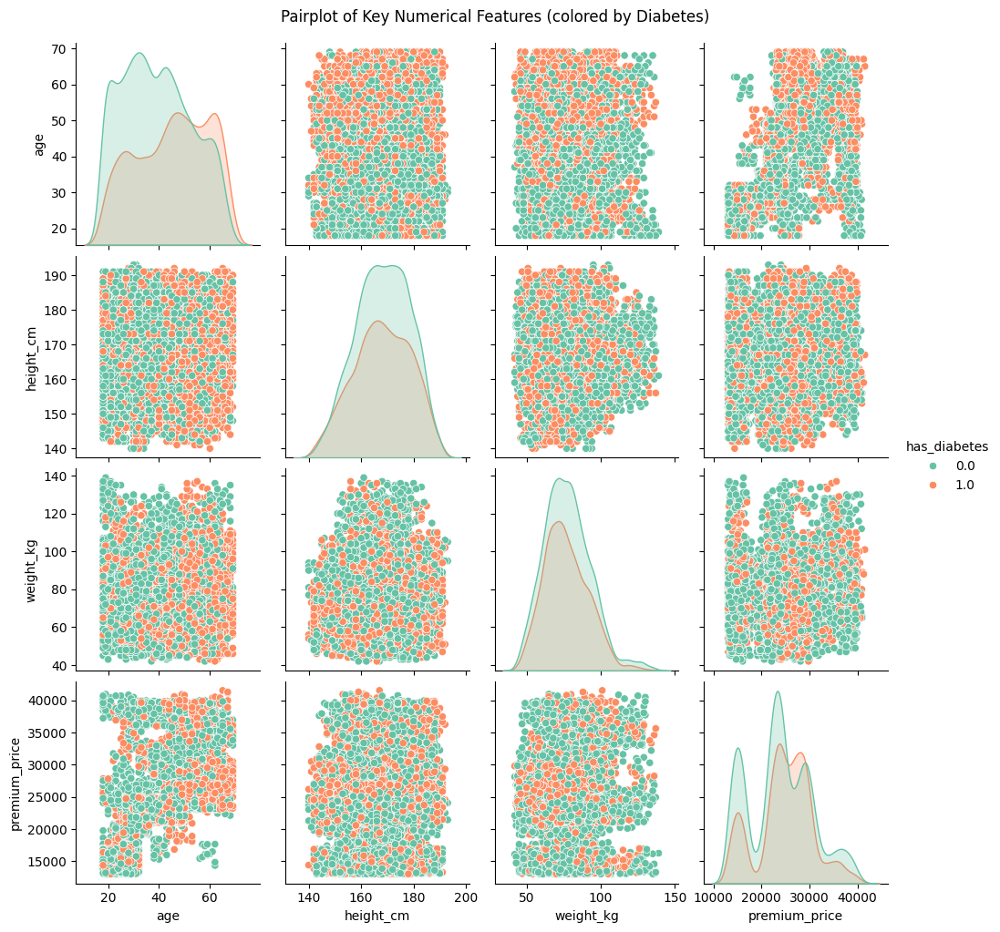

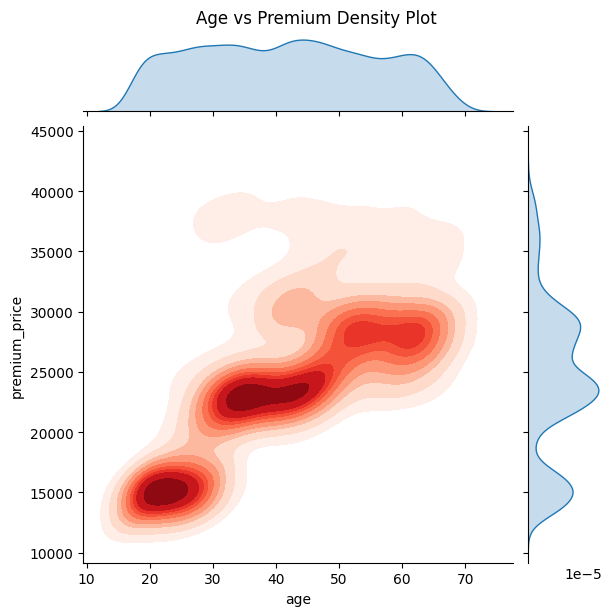

In [4]:
import pandas as pd
import plotly.express as px
import seaborn as sns
import matplotlib.pyplot as plt

# Load dataset
file_path = r"Insurance_DatasetFinal.csv"  # Adjust the path as necessary
df = pd.read_csv(file_path)

# Combine health groups
df['group'] = df.apply(lambda row: f"{'Chronic' if row['has_chronic_disease'] else 'No Chronic'} + "
                                    f"{'Diabetes' if row['has_diabetes'] else 'No Diabetes'}", axis=1)



# Bubble scatter: Premium vs Telehealth Usage
fig2 = px.scatter(df,
                  x='Telehealth_Usage_Pct',
                  y='premium_price',
                  size='major_surgeries_count',
                  color='has_chronic_disease',
                  hover_data=['age', 'has_diabetes'],
                  title='Telehealth Usage vs Premium (Bubble = Surgeries, Color = Chronic Disease)',
                  labels={
                      'Telehealth_Usage_Pct': 'Telehealth Usage %',
                      'premium_price': 'Premium Price',
                      'has_chronic_disease': 'Chronic Disease'
                  })

fig2.show()

# Boxplot by health group
fig3 = px.box(df,
               x='group',
               y='premium_price',
               points='all',
               color='group',
               title='Premium Distribution by Combined Health Group',
               labels={'group': 'Health Group', 'premium_price': 'Premium Price'})

fig3.update_layout(xaxis_tickangle=-45)
fig3.show()


# Age group categorization
df['age_group'] = pd.cut(df['age'], bins=[0, 30, 45, 60, 75, 100], labels=['<30', '30–45', '45–60', '60–75', '75+'])



# Pairplot
selected_features = ['age', 'height_cm', 'weight_kg', 'premium_price', 'has_diabetes']
sns.pairplot(df[selected_features], hue='has_diabetes', palette='Set2')
plt.suptitle("Pairplot of Key Numerical Features (colored by Diabetes)", y=1.02)
plt.show()

# Jointplot
sns.jointplot(data=df, x='age', y='premium_price', kind='kde', fill=True, cmap='Reds')
plt.suptitle("Age vs Premium Density Plot", y=1.02)
plt.show()

## Modeling

For our initial modeling:
- We selected a Random Forest Regressor as a baseline due to its robustness and ability to handle both linear and non-linear relationships.
- The dataset was split into training (80%) and testing (20%) subsets.
- Performance was evaluated using MAE, RMSE, and R² score.
- Random Forest was selected as our best model overall
This baseline gives us a benchmark to improve upon using hyperparameter tuning and model explainability tools like SHAP.


Model Evaluation:
MAE: 1774.63
RMSE: 2751.09
R^2 Score: 0.81


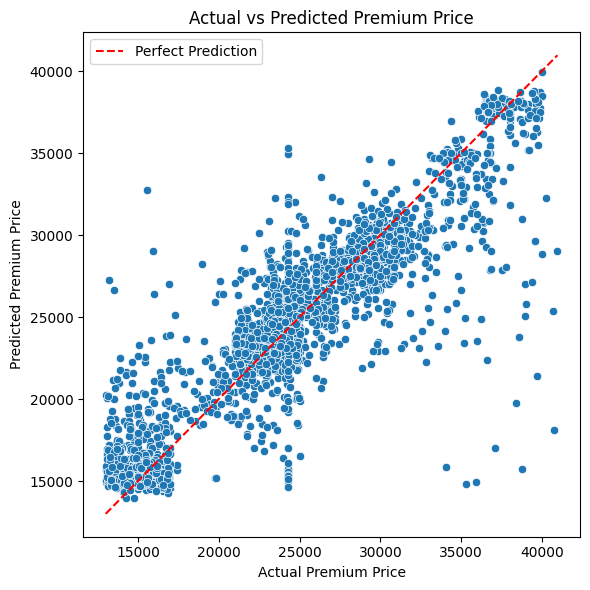

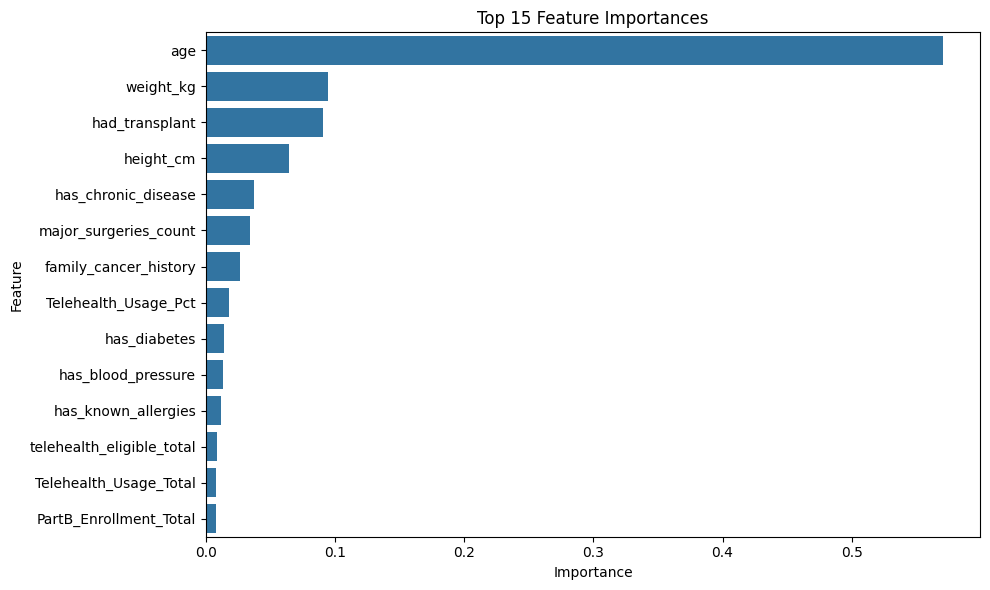

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from sklearn.preprocessing import OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Identify categorical columns in your dataframe
categorical_columns = df.select_dtypes(include=['object', 'category']).columns.tolist()
numerical_columns = df.select_dtypes(include=['int64', 'float64']).columns.tolist()

# Remove target variable from feature lists if it's included
if 'premium_price' in categorical_columns:
    categorical_columns.remove('premium_price')
if 'premium_price' in numerical_columns:
    numerical_columns.remove('premium_price')

# Feature matrix and target variable
X = df.drop(columns=['premium_price'])
y = df['premium_price']

# Create preprocessing steps for numerical and categorical data
preprocessor = ColumnTransformer(
    transformers=[
        ('num', 'passthrough', numerical_columns),
        ('cat', OneHotEncoder(handle_unknown='ignore', sparse_output=False), categorical_columns)
    ] if categorical_columns else [('num', 'passthrough', numerical_columns)]
)

# Create pipeline with preprocessing and model
model_pipeline = Pipeline(steps=[
    ('preprocessor', preprocessor),
    ('regressor', RandomForestRegressor(random_state=42))
])

# Train-test split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Train model with pipeline
model_pipeline.fit(X_train, y_train)

# Predict and evaluate
y_pred = model_pipeline.predict(X_test)
mae = mean_absolute_error(y_test, y_pred)
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

print("\nModel Evaluation:")
print(f"MAE: {mae:.2f}")
print(f"RMSE: {mse**0.5:.2f}")
print(f"R^2 Score: {r2:.2f}")

# Plot predicted vs actual
plt.figure(figsize=(6, 6))
sns.scatterplot(x=y_test, y=y_pred)
plt.xlabel("Actual Premium Price")
plt.ylabel("Predicted Premium Price")
plt.title("Actual vs Predicted Premium Price")
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], '--r', label="Perfect Prediction")
plt.legend()
plt.tight_layout()
plt.show()

# Feature importance analysis
if hasattr(model_pipeline[-1], 'feature_importances_'):
    # Get feature names after one-hot encoding
    feature_names = numerical_columns.copy()
    if categorical_columns:
        # Get categorical feature names after one-hot encoding
        encoder = model_pipeline.named_steps['preprocessor'].transformers_[1][1]
        categorical_features = encoder.get_feature_names_out(categorical_columns)
        feature_names.extend(categorical_features)
    
    # Get feature importances
    importances = model_pipeline[-1].feature_importances_
    
    # Create a DataFrame for visualization
    importance_df = pd.DataFrame({
        'Feature': feature_names,
        'Importance': importances
    }).sort_values('Importance', ascending=False)
    
    # Plot feature importances
    plt.figure(figsize=(10, 6))
    sns.barplot(x='Importance', y='Feature', data=importance_df.head(15))
    plt.title("Top 15 Feature Importances")
    plt.tight_layout()
    plt.show()